# GWR and Multivariate Bayesian Analysis Using rJAGS

With the dataset created from the python geospatial analysis and ABMI Human Footprint public data (https://abmi.ca/home/data-analytics/da-top/da-product-overview/Human-Footprint-Products.html), I peformed a multivariate Bayesian analysis using rJAGS, as well as a Geographically Weighted Regression. For a majority of the Bayesian part of this project my resources was the textbook Doing Bayesian Data Analysis by J. Kruschke for theory and the course Bayesian Modeling with rJAGS from DataCamp. For the Geographically Weighted Regression I used Chapter 9 from Spatial Modelling for Data Scientists by Francisco Rowe and Dani Arribas-Bel (https://gdsl-ul.github.io/san/gwr.html#selecting-a-bandwidth). 

# Packages

Code is included to install packages as well as load them into your R workspace. You do not need to install them at every start up. Common packages are included for installation, but user may already have them installed. Use # to prevent the installation of packages when running cell.

In [4]:
#-------Packages Used for Bayesian Analysis

#Install Packages
install.packages("rjags")
install.packages("ggplot2")

#Import Libraries
library(rjags)
#Plotting
library(ggplot2)

#----------Packages Used for GWR Analysis

#installing packages required
install.packages("sp")
install.packages("sf")
install.packages("spgwr")
install.packages("spData")
install.packages("tidyverse")
install.packages("lmtest")
install.packages("kableExtra")
install.packages("tmap")
install.packages("corrplot")
install.packages("RColorBrewer")
install.packages("viridis")
install.packages("jtools")
install.packages("stargazer")
install.packages("sjPlot")
install.packages("car")

#Loading required packages
# Data manipulation, transformation and visualisation 
library(tidyverse)
# Nice tables
library(kableExtra)
# Simple features (a standardised way to encode vector data ie. points 
library(sf)
# Spatial objects conversion
library(sp)
# Thematic maps
library(tmap)
# Colour palettes
library(RColorBrewer)
# More colour palettes
library(viridis) # nice colour schemes
#Fitting geographically weighted regression models
library(spgwr)
# Obtain correlation coefficients
library(corrplot)
# Exportable regression tables
library(jtools) 
library(stargazer) 
library(sjPlot)
#Assess multicollinearity 
library(car)
#Additional packages
library(CARBayes)
library(psych)
library(GGally)

Installing package into ‘/home/jupyter/R/x86_64-pc-linux-gnu-library/4.1’
(as ‘lib’ is unspecified)



ERROR: Error in library(rjags): there is no package called ‘rjags’


# Loading and Cleaning up non-spatial Data

In [ ]:
#Remember to set working directory if you haven't already done so 
abmi <- read.csv("ABMIWellDataset_3.csv", header=TRUE)
data(abmi)
head(abmi)

#Clean up dataframe by getting rid of unnessecary columns
abmiclean <- abmi[-c(2:4,7:8,10,11,18:20)] #- indicates columns you wan head(abmiclean)
names(abmiclean)
abmiclean1 <- na.omit(abmiclean) #remove any na values, sometimes excel 
abmiclean1$Well <- as.factor(abmiclean1$Well) #Tell R that Well is a categorical 
abmiclean1$Northerning <-as.numeric(abmiclean1$Northerning)#Tell R that Northerning numeric
abmiclean1$Easting <- as.numeric(abmiclean1$Easting)

#attach function allows to access variables of a data.frame without calling the dataframe each time 
#detach works in the same way and removes the effect
attach(abmiclean1)

# Loading Spatial Data

In [ ]:
#Adding shapefiles
gridshp <-st_read("gridtest5_1.shp") 
griddata <-read.csv("finalgrid.csv") 
griddatadf <-as.data.frame(griddata)

#check if grid shape has valid geometry
gridshp = sf::st_make_valid(gridshp)

#Create a SpatialPolygonDataFrame
data.combined <- combine.data.shapefile(data=griddata, shp=gridshp, dbf=) 
grid.sp <-merge(gridshp, griddata, by = "FID_1", all.x=FALSE) #create a spdf with python output and shapefile data
gridalldata <-merge(grid.sp, abmiclean1, by = "FID_1", all.x = FALSE) 
#merge with abmi data to create a dataframe with just the sites that have abmi information

# Exploratory Analysis
Exploratory analysis is preformed before applying spatial weights to examine the correlation between variables. The dataset used was highly skewed and had a high degree of heterodascity. The common solutions to these issues (e.g. log transformations, weighted regression) were not effective. The dataset used in this analysis is compiled together from different sources and is therefore unlikely to be accurate or approriate for real-world inference. it is simply used to write this code, and therefore this lack of normality will be ignored. If the dataset was to be used for real-world inference, it would be unadvisable to ignore these issues.

In [ ]:
describe(abmiclean1)
#High skewness HumanDistAmt, Anthro.Soil, moderate in LowVegPerc and Coniferous Trees Perc
#Only HumanDist or Anthro.Soil will be used
#Let's do a linear model to look at distribution
model1 <- lm(abmiclean1$LowVegPerc ~ abmiclean1$HumanDistAmt+abmiclean1$ConiferousTreesPerc+abmiclean1$Well)
summary(model1)
plot(model1, which=2)
model2 <- lm(abmiclean1$LowVegPerc ~ abmiclean1$Anthro.Soil+abmiclean1$ConiferousTreesPerc+abmiclean1$Well)
summary(model2)
plot(model2, which = 2)

#Both models have skewing and need transformation, trying log transformations of response variable as well as 
#HumanDistAmt and Anthro.Soil
logLowVegPerc <- log(abmiclean1$LowVegPerc)
logHumanDist <-log(abmiclean1$HumanDistAmt)
logAnthroSoil <-log(abmiclean1$Anthro.Soil)
model3 <- lm(abmiclean1$LowVegPerc ~ logHumanDist+abmiclean1$ConiferousTreesPerc+abmiclean1$Well)
#This did not work because of the infinite values in the dataset after the logtransformation

#we can try using weighted regression
wt1 <- 1 / lm(abs(model1$residuals) ~ model1$fitted.values)$fitted.values^2
wt2 <- 1 / lm(abs(model2$residuals) ~ model2$fitted.values)$fitted.values^2
model1_wt <- lm(LowVegPerc ~ HumanDistAmt+ConiferousTreesPerc+Well, data=abmiclean1, weights=wt1)
summary(model1_wt)
plot(model1_wt, which=2)
#This did not help at all

In [ ]:
#The nature of the relationships in the data can be also viewed graphically.

#Exploring the data through multiple plots. This is a powerful way to graphically analysis your data and more 
#information on this technique can be found here https://ggobi.github.io/ggally/reference/ggpairs.html
ggpairs(data = abmiclean1, columns = c(2:6))

#To look at the significant relationships between multiple variables, a corralgram is also useful and attractive

#obtain a matrix of Pearson correlation coefficients
df_sel <- st_set_geometry(gridalldata[,c(4:6,11:14)], NULL) # temporary dataframe without geometry data 
cormat <- cor(df_sel, use="complete.obs", method="pearson")

# significance test
sig1 <- corrplot::cor.mtest(df_sel, conf.level = .95)

# creta a correlogram
corrplot::corrplot(cormat, type="lower", method = "circle",
order = "original",
tl.cex = 0.7,
p.mat = sig1$p, sig.level = .05,
col = viridis::viridis(100, option = "plasma"), diag = FALSE)

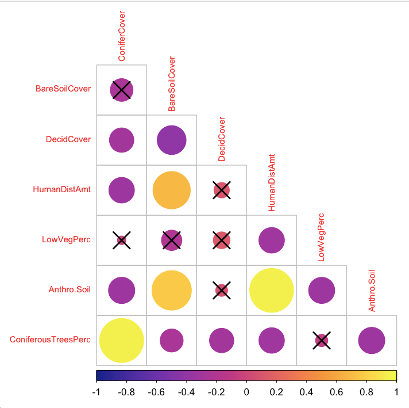
Interpretting correlogram:
<br>Size of circle = strength of relationship by Pearson-coefficient
<br>X indicates lack of significance at 0.95 CL
<br>Colour indicates positive or negative relationship

# Performing the Geographically Weighted Regression

To do this we simply add geographicaly weights to our previous linear models

In [ ]:
#Calibrate bandwidth
bw = gwr.sel(LowVegPerc ~ HumanDistAmt+ConiferousTreesPerc+Well, data=map, adapt=T)

#fit the model
gwr.model = gwr(LowVegPerc ~ HumanDistAmt+ConiferousTreesPerc+Well, data=map, adapt=bw,
                hatmatrix=TRUE, se.fit=TRUE)
gwr.model

R2 is 0.16 (low), and the model has high parsimony as expected, the best model would only have the humandistamt as a predictor variable but we want to psuedo run this with multiple variables.
<br>
<br>Results: Look at Global column
<br>For every 1% increase in HDA, low vegetation cover decreases by 0.34, conifer tree cover decreases low vegetation cover by 0.21, and well presence increases low vegetation cover by 0.067.

In [ ]:
#Creation of maps with the output
#Save output as dataframe
abmi_gwr <- as.data.frame(gwr.model$SDF)

gridalldata$V1 <- abmi_gwr$V1

#Map various outputs by changing the column in this code
legend_title = expression("V1")
map_fbgwr1 = tm_shape(gridalldata) +
  tm_fill(col = "V1", title = legend_title, palette = magma(256), style = "cont") + # add fill
  tm_borders(col = "white", lwd = .1)  + # add borders
  tm_compass(type = "arrow", position = c("right", "top") , size = 5) + # add compass
  tm_scale_bar(breaks = c(0,1,2), text.size = 0.7, position =  c("center", "bottom")) + # add scale bar
  tm_layout(bg.color = "white") # change background colour
map_fbgwr1 + tm_shape(gridshp) + # add region boundaries
  tm_borders(col = "white", lwd = .5) # add borders

# Multivariate Bayesian Analysis


## Informed Prior
The first prior used was an informed prior. This prior used the mean and standard deviation from 10 of the replicates to create a normal distribution prior. 

In [ ]:
#Construct plot to examine data of low vegetation cover and conifer tree cover by well presence/absence
ggplot(abmiclean1, aes (y=LowVegPerc, x=ConiferousTreesPerc, color = Well)) +
  geom_point() +
  geom_smooth(method = "lm", se=FALSE)

#Construct plot to examine data of low vegetation cover and human disturbance cover by well presence/absence
ggplot(abmiclean1, aes (y=LowVegPerc, x=HumanDistAmt, color = Well)) +
  geom_point() +
  geom_smooth(method = "lm", se=FALSE)

The first step to peforming Bayesian analysis with rJAGS is to define your model. This is an empty model that you will build into, and is also were you define your priors.

In [ ]:
#----Define model
lowveg_model <- "model{ 
    #Likelihood model for Y[i]
    for(i in 1:length(Y)) {
      Y[i] ~dnorm(m[i], s^(-2))
      m[i] <- a + b[X[i]] + d*R[i]+ c*Z[i] 
    }
    #Prior models for a,b,c,d,s
    a~dnorm (0.16, 0.28^(-2))
    b[1] <- 0
    b[2] ~ dnorm(0.16, 0.28^(-2))
    c ~ dnorm(0.16, 0.28^(-2))
    d ~ dnorm(0.16, 0.28^(-2))
    s ~ dunif(0,1)
  }"

Next you need to compile your data into the model (it is important that categorical variables are defined as factors before this point).

In [ ]:
#-----Compile the model
lowveg_jags <- jags.model(textConnection(lowveg_model),
            data= list(Y=abmiclean1$LowVegPerc, X=abmiclean1$Well,
                       R = abmiclean1$HumanDistAmt, Z=abmiclean1$ConiferousTreesPerc),
            inits=list(.RNG.name = "base::Wichmann-Hill", .RNG.seed = 10) #RNG seeds can be modified
                          )

Next you create your posterior using chains. 

In [ ]:
#----Simulate posterior - here you indicate the number of iterations for chains
lowveg_sim <- coda.samples(model = lowveg_jags, variable.names = c("a", "b", "c", "d", "s"),
                           n.iter=10000)
#store the chains in a data frame
lowveg_chains <- data.frame(lowveg_sim[[1]])

#Plot the posterior and view summary
plot(lowveg_sim) #Look for convergence, if not there increase iterations
summary(lowveg_sim) #Examine covariates for trends

#Plot the posterior mean regression models
ggplot(abmiclean1, aes(y=abmiclean1$LowVegPerc, x=abmiclean1$ConiferousTreesPerc,
                       color=abmiclean1$Well)) +
  geom_point() + 
  geom_abline(intercept = mean(lowveg_chains$a),
              slope=mean(lowveg_chains$c), color = "blue") +
  geom_abline(intercept = mean(lowveg_chains$a) + mean(lowveg_chains$b.2.), 
              slope=mean(lowveg_chains$c), color = "red")

Convergence of chains was ideal for all covariates

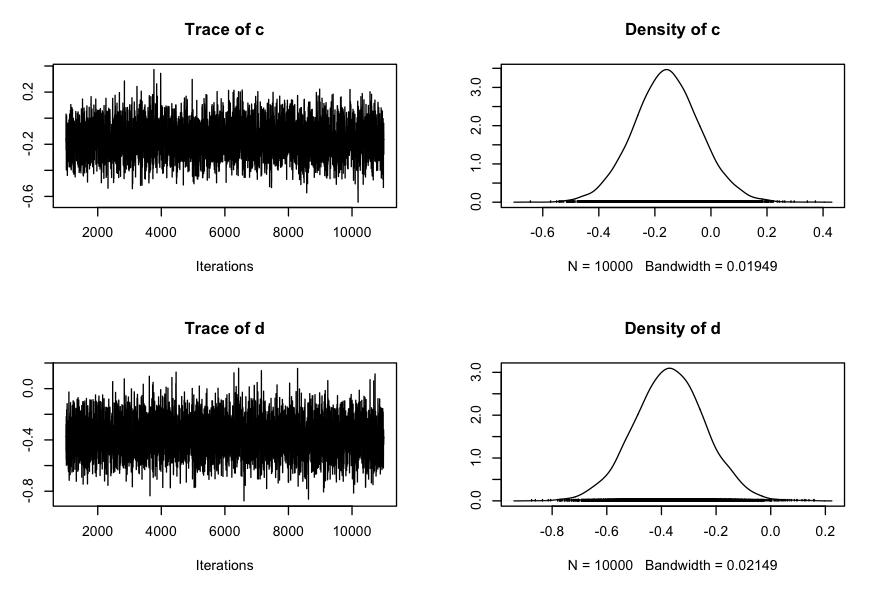

The trend of the data reflects what we expect, although fit is very poor.

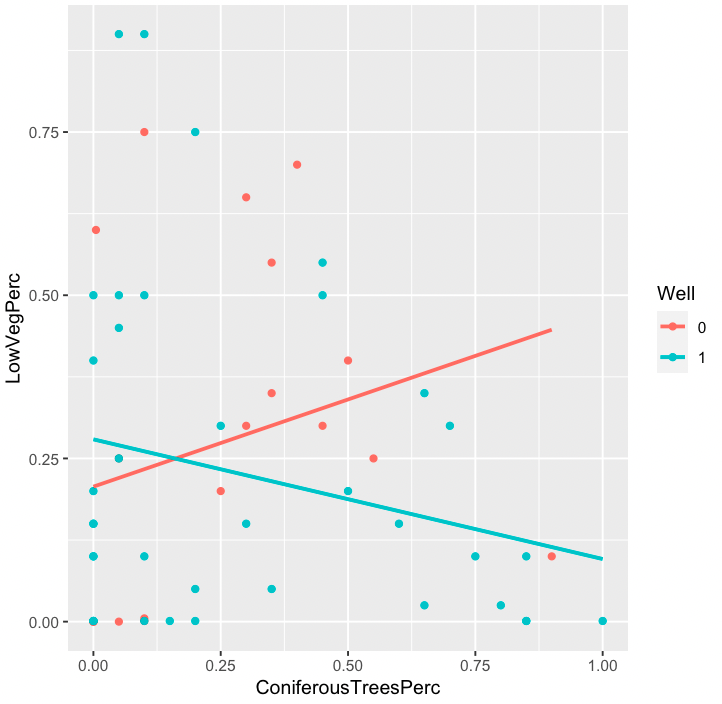
Now we need to create 95% Credible Intervals for the covariates to understand their significance (if the credible intervals includes 0 we cannot call it significant). 

In [ ]:
#--------Credible intervals for predictors
#Well
ci_95_Wells <-quantile (lowveg_chains$b.2., probs = c(0.025, 0.975))
ci_95_Wells

#Human Disturbance
ci_95_HD <-quantile (lowveg_chains$d, probs = c(0.025, 0.975))
ci_95_HD

#Conifer Tree Coverage
ci_95_CT <-quantile (lowveg_chains$c, probs = c(0.025, 0.975))
ci_95_CT

## Normal prior
We know the dataset has a normal distribution, so we create a normal prior assumming it is centered at the middle point of 0.50 (the coverage goes from 0 to 1.00). Using the Empirical Rule we know 99.7% of the data is within 3 standard deviations of the mean, therefore we can divide 0.50 by 3 to get one standard deviation for the prior  (0.167). 

In [ ]:
#----NORMAL PRIOR (0.5, 0.17)----
#----Define model
lowveg_model_norm <- "model{ 
    #Likelihood model for Y[i]
    for(i in 1:length(Y)) {
      Y[i] ~dnorm(m[i], s^(-2))
      m[i] <- a + b[X[i]] + d*R[i]+ c*Z[i] 
    }
    #Prior models for a,b,s
    a~dnorm (0.50, 0.17^(-2))
    b[1] <- 0
    b[2] ~ dnorm(0.50,0.17^(-2))
    c ~ dnorm(0.50, 0.17^(-2))
    d ~ dnorm(0.50, 0.17^(-2))
    s ~ dunif(0,1)
  }"

#-----Compile the model
lowveg_jags_norm <- jags.model(textConnection(lowveg_model_norm),
                          data= list(Y=abmiclean1$LowVegPerc, X=abmiclean1$Well, R = abmiclean1$HumanDistAmt, Z=abmiclean1$ConiferousTreesPerc),
                          inits=list(.RNG.name = "base::Wichmann-Hill", .RNG.seed = 10))

#----Simulate posterior
lowveg_sim_norm <- coda.samples(model = lowveg_jags_norm, variable.names = c("a", "b", "c", "d", "s"),
                           n.iter=10000)
#store the chains in a data frame
lowveg_chains_norm <- data.frame(lowveg_sim_norm[[1]])

#Plot the posterior and view summary
plot(lowveg_sim_norm)
summary(lowveg_chains_norm)
summary(lowveg_sim_norm)

#Plot the posterior mean regression models
ggplot(abmiclean1, aes(y=abmiclean1$LowVegPerc, x=abmiclean1$HumanDistAmt,
                       color=abmiclean1$Well)) +
  geom_point() + 
  geom_abline(intercept = mean(lowveg_chains_norm$a),
              slope=mean(lowveg_chains_norm$c), color = "blue") +
  geom_abline(intercept = mean(lowveg_chains_norm$a) + mean(lowveg_chains_norm$b.2.), 
              slope=mean(lowveg_chains_norm$c), color = "red")

ggplot(abmiclean1, aes(y=abmiclean1$LowVegPerc, x=abmiclean1$ConiferousTreesPerc,
                       color=abmiclean1$Well)) +
  geom_point() + 
  geom_abline(intercept = mean(lowveg_chains_norm$a),
              slope=mean(lowveg_chains_norm$c), color = "blue") +
  geom_abline(intercept = mean(lowveg_chains_norm$a) + mean(lowveg_chains_norm$b.2.), 
              slope=mean(lowveg_chains_norm$c), color = "red")

#--------Credible intervals for predictors
#Well
ci_95_Wells_norm <-quantile (lowveg_chains_norm$b.2., probs = c(0.025, 0.975))
ci_95_Wells_norm

#Human Disturbance
ci_95_HD_norm <-quantile (lowveg_chains_norm$d, probs = c(0.025, 0.975))
ci_95_HD_norm

#Conifer Tree Coverage
ci_95_CT_norm <-quantile (lowveg_chains_norm$c, probs = c(0.025, 0.975))
ci_95_CT_norm

## Uniform Prior
One of the most commonly used types of priors for analysis is a Uniform Prior. It is considered to have no effect on the distribution since it makes all the possible outcomes equally plausible. For this we used the Uniform Prior on the interval 0, 1 which is the default uniform prior interval for many softwares.

In [ ]:
#----UNIFORM PRIOR (0, 1)----
#----Define model
lowveg_model_uni <- "model{ 
    #Likelihood model for Y[i]
    for(i in 1:length(Y)) {
      Y[i] ~dnorm(m[i], s^(-2))
      m[i] <- a + b[X[i]] + d*R[i]+ c*Z[i] 
    }
    #Prior models for a,b,s
    a~dunif (0, 1)
    b[1] <- 0
    b[2] ~ dunif(0, 1)
    c ~ dunif(0, 1)
    d ~ dunif(0, 1)
    s ~ dunif(0, 1)
  }"

#-----Compile the model
lowveg_jags_uni <- jags.model(textConnection(lowveg_model_uni),
                               data= list(Y=abmiclean1$LowVegPerc, X=abmiclean1$Well, 
                                          R = abmiclean1$HumanDistAmt, Z=abmiclean1$ConiferousTreesPerc),
                               inits=list(.RNG.name = "base::Wichmann-Hill", .RNG.seed = 10))

#----Simulate posterior
lowveg_sim_uni <- coda.samples(model = lowveg_jags_uni, variable.names = c("a", "b", "c", "d", "s"),
                                n.iter=10000)
#store the chains in a data frame
lowveg_chains_uni <- data.frame(lowveg_sim_uni[[1]])

#Plot the posterior and view summary
plot(lowveg_sim_uni)
summary(lowveg_chains_uni)
summary(lowveg_sim_uni)

#Plot the posterior mean regression models
ggplot(abmiclean1, aes(y=abmiclean1$LowVegPerc, x=abmiclean1$HumanDistAmt,
                       color=abmiclean1$Well)) +
  geom_point() + 
  geom_abline(intercept = mean(lowveg_chains_uni$a),
              slope=mean(lowveg_chains_uni$c), color = "blue") +
  geom_abline(intercept = mean(lowveg_chains_uni$a) + mean(lowveg_chains_uni$b.2.), 
              slope=mean(lowveg_chains_uni$c), color = "red")

ggplot(abmiclean1, aes(y=abmiclean1$LowVegPerc, x=abmiclean1$ConiferousTreesPerc,
                       color=abmiclean1$Well)) +
  geom_point() + 
  geom_abline(intercept = mean(lowveg_chains_uni$a),
              slope=mean(lowveg_chains_uni$c), color = "blue") +
  geom_abline(intercept = mean(lowveg_chains_uni$a) + mean(lowveg_chains_uni$b.2.), 
              slope=mean(lowveg_chains_uni$c), color = "red")

#--------Credible intervals for predictors
#Well
ci_95_Wells_uni <-quantile (lowveg_chains_uni$b.2., probs = c(0.025, 0.975))
ci_95_Wells_uni

#Human Disturbance
ci_95_HD_uni <-quantile (lowveg_chains_uni$d, probs = c(0.025, 0.975))
ci_95_HD_uni

#Conifer Tree Coverage
ci_95_CT_uni <-quantile (lowveg_chains_uni$c, probs = c(0.025, 0.975))
ci_95_CT_uni


# Inference

The final output of the normal, uniform, and informed prior analysis is presented in the table below. Bolded values indicate significance.

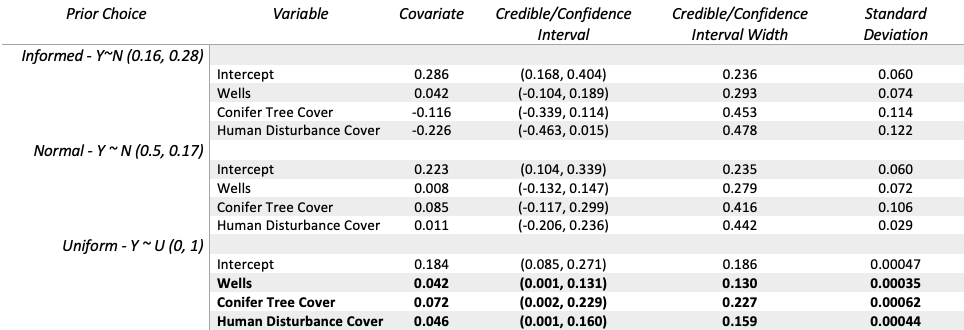
<br>
<br> The results from the geographically weighted regression is presented below. The AIC and RSS values are both large indicating poor fit. This is supported by the r-squared value of 0.16.

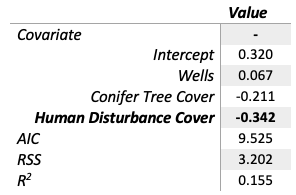

The trends of the geographically weighted regression, and the Bayesian analysis with normal and informed priors follow similiar trends, with the presence of human disturbance and conifer trees causing a decline in low vegetation coverage. This is what we'd expect given previous research. Only human disturbance was found to significantly influence low vegetation for the geographically weighted regression. Literature would lead us to believe that conifer tree coverage would also influence low vegetation coverage, and the p-value for geographicaly weighted regression was 0.06. With a stronger dataset we may have seen an significant influence.
<br>
<br>For the normal and informed priors we saw no significant influence. The upper 95% credible interval for human disturbance with the informed prior was closest to 0 of all the credible intervals for informed and normal priors. This may also have seen significance with a stronger dataset. The normal prior had similiar credible interval widths as the informed prior, however they were shifted upwards of the informed prior credible intervals and more firmly include 0. The normal prior also has covariates predicting that all predictor variables will positively influence the amount of low vegetation cover, which goes against what we'd expect from literature.
<br>
<br>Uniform priors are one of the most commonly used default priors for Bayesian Analysis. It's influence on this dataset has raised concern regarding it's popularity. The trends predicted by this prior were opposite that of what would be expected given past literature (it predicts that human disturbance and conifer tree coverage would increase the coverage of low vegetation). All predictor variables were also found to be significant, even though Wells and conifer tree cover were never found to be significant in the other analyses. All credible intervals are very near 0 (0.001 - 0.002), therefore they should be questioned. It is concerning we were able to get significance despite it never appearing otherwise. The quality of this dataset is questionable, and after the implementation on a future dataset it will be interesting to see if these trends remain true.
<br>
<br>Due to the small dataset and quick convergence, the time to implement the geographically weighted regression and the Bayesian Analyses was approximately the same (less than 1 minute). Both methods of analysis were also able to be performed on a 1.8 GHz Dual-Core Intel Core i5 MacBook Air. This makes the implementation of both methods possible without advanced computer software or hardware. The use of rJAGS (a open source, free software) also increases this accessibility. 

# Application
<br>
The output from this analysis can be used to predict the occurance of low vegetation, although the lack of fit and significance means this inference is inappropriate. Below is a map showing the expected occurence of low vegetation using the Bayesian analysis with a informed prior. The scale is from 0.05 to 0.30
<br>